In [4]:
import matplotlib.pyplot as plt
import pydicom
from pydicom.data import get_testdata_file
import cv2
import os
from skimage import morphology
import math
import numpy as np
from scipy import ndimage
from tqdm import tqdm
import glob as glob
import SimpleITK as sitk
import sys
from pydicom.encaps import encapsulate
from pydicom.uid import JPEG2000
from pydicom.pixel_data_handlers.util import apply_modality_lut
from imagecodecs import jpeg_encode
import imagecodecs
import random
from pydicom.uid import ExplicitVRLittleEndian
from imagecodecs import jpeg_encode
import imagecodecs
import pylibjpeg
import json
import copy
# # CT

# In[ ]:
def sorted_files(folder):
    ins=[]
    ser=[]
    f= sorted(glob.glob((folder + "/**/*.dcm"),recursive = True))

    for name in tqdm(f):
        try:
            ds = pydicom.dcmread(os.path.join(folder,name))
            temp = float(ds.InstanceNumber)
            temp1 = ds.SeriesInstanceUID
            ins.append(int(temp))
            ser.append(temp1)
        except:
            itkimage = sitk.ReadImage(os.path.join(folder,name))
            temp= float(itkimage.GetMetaData('0020|0013')) # instance number 
            temp1= itkimage.GetMetaData('0020|000e') #series instance UID 
            ins.append(int(temp))
            ser.append(temp1)
    series=np.unique(ser)
    files=[[x for sr,_,x in sorted(zip(ser,ins,f)) if sr==s] for s in series]
    return files

def get_scan(path):
    f= sorted_files(path)
    series=[]
    files=[]
    for i in tqdm (range (len(f))):
        img=[]
        file=[]
        for filename in f[i]:
            itkimage = sitk.ReadImage(os.path.join(path,filename))
            numpyImage = sitk.GetArrayFromImage(itkimage)
            img.append(numpyImage[0,:,:])
            file.append(filename)
        series.append(img)
        files.append(file)
    return series,files

def dynamic_windowing_mri(scan, scan_seriesi):
    counts,bins,bars = plt.hist(scan.flatten())
    
#     print(bins[-1])
    plt.close()
    if bins[-1]>3200:
        a  = 2
#         print("Type 2")
        scan = get_normalized(scan, -800, 2500)
    elif bins[-1]>350:
        a = 3
#         print("Type 3")
        scan = get_normalized(scan, 5, 100)
    else:
        scan = get_normalized(scan, np.min(scan), np.max(scan))
        a = 1
    return scan,a

def get_normalized(scan,mn,mx):
    scann = copy.copy(scan)
    try:
        mn = max(mn,np.amin(scann))
        mx = min(mx,np.amax(scann))
    except:
        print("in except")
        scann2 = copy.copy(scan)
        scann2 = scann2[:scann2.shape[0]-1,:,:]
        mn = max(mn,np.amin(scann2))
        mx = min(mx,np.amax(scann2))
    np.clip(scann, mn, mx, out=scann)
    d = mx - mn
    scann = (scann-mn)/d
    return scann

def MRI_brain_blurred_axial(image, scan_img, low=50, high=500):

    rows=image.shape[1]
    columns=image.shape[0]
    #print(rows,columns)
    #print(image.shape)
    head = image > low
    skull = image > high
    ROI=np.logical_xor(head,skull)
    kernel = np.ones((30, 30), np.uint8)
    
    imagee = cv2.morphologyEx(ROI.astype(np.uint8), cv2.MORPH_CLOSE, kernel)
    imagee = ndimage.binary_fill_holes(imagee)
    imagee = imagee.astype(np.uint8)
    contours, hierarchy = cv2.findContours(imagee, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    gray = np.zeros_like(imagee)
    gray = cv2.drawContours(gray, contours,0, 255, 2)
#     plt.imshow(gray,'gray')
#     plt.show()
    temp=gray.copy()
    temp=np.where((temp==255),1,0)
    variable=int((temp.shape[0])/2)
    temp[variable:,:] = 0
    #plt.imshow(temp,'gray')
    #plt.show()
    
    r=[[random.randint(-250,500) for i in range(rows)] for j in range(columns)]
    r=np.asarray(r)
    #print(r.shape)
    blurred_img= np.multiply(temp,r)
    out = np.where((temp==1), blurred_img, scan_img)
    
    #plt.imshow(out,'gray')
    #plt.show()
    return out

def MRI_brain_blurred_sagittal(image, scan_img, low=50, high=500):

    rows=image.shape[1]
    columns=image.shape[0]
    #print(rows,columns)
    #print(image.shape)
    head = image > low
    skull = image > high
    ROI=np.logical_xor(head,skull)
    kernel = np.ones((30, 30), np.uint8)
    
    imagee = cv2.morphologyEx(ROI.astype(np.uint8), cv2.MORPH_CLOSE, kernel)
    imagee = ndimage.binary_fill_holes(imagee)
    imagee = imagee.astype(np.uint8)
    contours, hierarchy = cv2.findContours(imagee, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    gray = np.zeros_like(imagee)
    gray = cv2.drawContours(gray, contours,0, 255, 2)
#     plt.imshow(gray,'gray')
#     plt.show()
    temp=gray.copy()
    temp=np.where((temp==255),1,0)
    variable=int((temp.shape[0])/2)
    temp[:,variable:] = 0
    #plt.imshow(temp,'gray')
    #plt.show()
    
    r=[[random.randint(-250,500) for i in range(rows)] for j in range(columns)]
    r=np.asarray(r)
    #print(r.shape)
    blurred_img= np.multiply(temp,r)
    out = np.where((temp==1), blurred_img, scan_img)
    
    #plt.imshow(out,'gray')
    #plt.show()
    return out

def MRI_brain_blurred_coronal(image, scan_img, low=50, high=500):

    rows=image.shape[1]
    columns=image.shape[0]
    #print(rows,columns)
    #print(image.shape)
    head = image > low
    skull = image > high
    ROI=np.logical_xor(head,skull)
    kernel = np.ones((30, 30), np.uint8)
    
    imagee = cv2.morphologyEx(ROI.astype(np.uint8), cv2.MORPH_CLOSE, kernel)
    imagee = ndimage.binary_fill_holes(imagee)
    imagee = imagee.astype(np.uint8)
    contours, hierarchy = cv2.findContours(imagee, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    gray = np.zeros_like(imagee)
    gray = cv2.drawContours(gray, contours,0, 255, 2)
#     plt.imshow(gray,'gray')
#     plt.show()
    temp=gray.copy()
    temp=np.where((temp==255),1,0)
#     variable=int((temp.shape[0])/2)
#     temp[variable:,:] = 0
    #plt.imshow(temp,'gray')
    #plt.show()
    
    r=[[random.randint(-250,500) for i in range(rows)] for j in range(columns)]
    r=np.asarray(r)
    #print(r.shape)
    blurred_img= np.multiply(temp,r)
    out = np.where((temp==1), blurred_img, scan_img)
    
    #plt.imshow(out,'gray')
    #plt.show()
    return out

def main(path, output_folder):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    output_list= []
    classUID = []
    annotations=[]   
    
    scan_series,filenames = get_scan(path)

    for j in tqdm(range(len(scan_series))):
        scan, names = scan_series[j],filenames[j]
        scan = np.asarray(scan)
        if scan[0].shape != scan[-1].shape:
            
            name = names[-1]
            img = scan[-1]
            dcmData = pydicom.dcmread(os.path.join(path,name)) 
            _, tail = os.path.split(name)
            des_path = os.path.join(output_folder, tail)
            dcmData.save_as(des_path) 
            classUID.append(str(dcmData.SOPInstanceUID))
            output_list.append(des_path) 
            annotations.append(None)   
            scan = []
            for i in range(len(scan_series[j])-1):
                scan.append(np.asarray(scan_series[j][i]))
            scan = np.asarray(scan)
#         print("SHAPE: ", scan.shape)
#         print("reading ",j)
        dcmData = pydicom.dcmread(os.path.join(path,names[0]))
#         print("read", j)
        if (dcmData.PhotometricInterpretation == "RGB" ):
#             print("rgb")
            for i in range(scan.shape[0]):
                name = names[i]
                img = scan[i, :, :]
                dcmData = pydicom.dcmread(os.path.join(path,name)) 
                _, tail = os.path.split(name)
                des_path = os.path.join(output_folder, tail)
                dcmData.save_as(des_path) 
                classUID.append(str(dcmData.SOPInstanceUID))
                output_list.append(des_path) 
                annotations.append(None)
        elif (dcmData.PhotometricInterpretation == "rgb"):
#             print("rgb")
            for i in range(scan.shape[0]):
                name = names[i]
                img = scan[i, :, :]
                dcmData = pydicom.dcmread(os.path.join(path,name)) 
                _, tail = os.path.split(name)
                des_path = os.path.join(output_folder, tail)
                dcmData.save_as(des_path) 
                classUID.append(str(dcmData.SOPInstanceUID))
                output_list.append(des_path) 
                annotations.append(None)
        else:
            wind_scan, t = dynamic_windowing_mri(scan, scan_series[j])
#             print("axial")
            axial  =  np.array([1., 0., 0., 0., 1., 0.])
            #sagittal= np.array([-1., 0., 0., 0., 0., -1.])
            sagittal= np.array([0., 1., 0., 0., 0., -1.])
            coronal= np.array([1., 0., 0., 0., 0., -1.])
            if (0x0020,0x0037) in dcmData:
#                 print("in dcmdata orientation")
                a = (np.around(dcmData.ImageOrientationPatient, 0))
    #             print("a",a)
    #             print("scan shape",scan.shape[0])
    #             image= scan#[20,:,:]
    #             histogram, bin_edges = np.histogram(image, bins=256)
    #             check=bin_edges[-1]

                if ((a == axial).all()): #and check > 350 :
#                     print("axial")
    #                 print(j)
                    #continue
                    for i in range(scan.shape[0]):
                        name = names[i]
                        wind_img = wind_scan[i, :, :]
                        scan_img = scan[i, :, :]
#                         print("reading ",i)
                        dcmData = pydicom.dcmread(os.path.join(path,name)) ##read file to change it's pixel data to anonymized
                        c= dcmData.Rows
                        r=dcmData.Columns
                        dicom_img = dcmData.pixel_array
#                         print("read ",i)
                        out= MRI_brain_blurred_axial(wind_img*np.max(scan_img),scan_img, 50, 500)
                        #out = out.astype(np.int16)
                        #print(dicom_img.dtype)
                        out1 = out.astype(dicom_img.dtype)
                        #print(out.shape)
                        dcmData.file_meta.TransferSyntaxUID= '1.2.840.10008.1.2.1'
                        dcmData.PixelData = out1.tobytes()
                        '''
                        plt.imshow(dcmData.pixel_array,'gray')
                        plt.title("axial blurred")
                        plt.show()

                        plt.imshow(out, 'gray')
                        plt.title("axial blurred OUT")
                        plt.show()
                        '''
                        _, tail = os.path.split(name)
                        des_path = os.path.join(output_folder, tail)
                        dcmData.save_as(des_path) ##save file in anonym folder


                        classUID.append(str(dcmData.SOPInstanceUID))
                        output_list.append(des_path)
                        annotations.append(None)

                elif ((a==sagittal).all()): #and check>350:
    #                     print(j)
    #                     print("sag")
                       # continue
                        for i in range(scan.shape[0]):
                            name = names[i]
                            wind_img = wind_scan[i, :, :]
                            scan_img = scan[i, :, :]
                            dcmData = pydicom.dcmread(os.path.join(path,name)) ##read file to change it's pixel data to anonymized
                            c= dcmData.Rows
                            r=dcmData.Columns
                            dicom_img = dcmData.pixel_array
                            out= MRI_brain_blurred_sagittal(wind_img*np.max(scan_img),scan_img, 100, 1000)
    #                         if i == 0:
    #                             out = img
    #                         else:
    #                             out = MRI_blurred_sag(img,dicom_img,r,c)
                            #out = out.astype(np.int16)
                            out = out.astype(dicom_img.dtype)
                            #plt.imshow(out,'gray')
                            #plt.show()

                            dcmData.file_meta.TransferSyntaxUID= '1.2.840.10008.1.2.1'
                            #dcmData.pixel_array = out
                            dcmData.PixelData = out.tobytes()
                            #dcmData.PixelData = out.tostring()
                            #dcmData.BitsAllocated = 
                            #dcmData.PixelRepresentation = 1
                            '''
                            plt.imshow(dcmData.pixel_array,'gray')
                            plt.title("sagittal blurred")
                            plt.show()

                            plt.imshow(out, 'gray')
                            plt.title("sagittal blurred OUT")
                            plt.show()
                            '''
                            _, tail = os.path.split(name)
                            des_path = os.path.join(output_folder, tail)
                            dcmData.save_as(des_path) ##save file in anonym folder

                            classUID.append(str(dcmData.SOPInstanceUID))
                            output_list.append(des_path)
                            annotations.append(None)
                elif ((a==coronal).all()): #and (scan.shape[0]>100) and  check>350:
    #                     print(j)
    #                     scan.shape[0]
    #                     print("coronal")
                        #continue

                        for i in range(scan.shape[0]):
    #                     for i in range(50): #distorting the boundary for only the front of the coronal scan i.e the face part
                            if i<50:
                                name = names[i]
                                wind_img = wind_scan[i, :, :]
                                scan_img = scan[i, :, :]
                                dcmData = pydicom.dcmread(os.path.join(path,name)) ##read file to change it's pixel data to anonymized
                                c= dcmData.Rows
                                r=dcmData.Columns
                                dicom_img = dcmData.pixel_array
                                out= MRI_brain_blurred_coronal(wind_img*np.max(scan_img),scan_img, 100, 1000)
    #                             if i == 0:
    #                                 out = img
    #                             else:
    #                                 out = MRI_blurred_coronal(img,dicom_img,r,c)
                                #out = out.astype(np.int16)
                                out = out.astype(dicom_img.dtype)
                                #plt.imshow(out,'gray')
                                #plt.show()

                                dcmData.file_meta.TransferSyntaxUID= '1.2.840.10008.1.2.1'
                                #dcmData.file_meta.TransferSyntaxUID= 'Explicit VR Big Endian'
                                #dcmData.pixel_array = out
                                dcmData.PixelData = out.tobytes()
                                #dcmData.PixelData = out.tostring()

                                '''
                                plt.imshow(dcmData.pixel_array,'gray')
                                plt.title("coronal blurred")
                                plt.show()

                                plt.imshow(out, 'gray')
                                plt.title("coronal blurred OUT")
                                plt.show()
                                ''' 
                                _, tail = os.path.split(name)
                                des_path = os.path.join(output_folder, tail)
                                dcmData.save_as(des_path) ##save file in anonym folder

                                classUID.append(str(dcmData.SOPInstanceUID))
                                output_list.append(des_path)
                                annotations.append(None)
                            else:
                                name = names[i]
                                img = scan[i, :, :]
                                dcmData = pydicom.dcmread(os.path.join(path,name)) ##read file to change it's pixel data to anonymized
                                #print(dcmData.file_meta.TransferSyntaxUID)

                                dcmData.file_meta.TransferSyntaxUID= '1.2.840.10008.1.2.1'
                                #dcmData.file_meta.TransferSyntaxUID= 'Explicit VR Big Endian'
                                #dcmData.pixel_array = out
                                #dcmData.PixelData = out.tostring()

                                '''
                                plt.imshow(dcmData.pixel_array,'gray')
                                plt.title("coronal blurred")
                                plt.show()

                                plt.imshow(out, 'gray')
                                plt.title("coronal blurred OUT")
                                plt.show()
                                ''' 
                                _, tail = os.path.split(name)
                                des_path = os.path.join(output_folder, tail)
                                dcmData.save_as(des_path) ##save file in anonym folder

                                classUID.append(str(dcmData.SOPInstanceUID))
                                output_list.append(des_path)
                                annotations.append(None)
                        else:
                            #print("ccc")
                            #continue
                            for i in range(scan.shape[0]):
                                #print(scan.shape[0],i)
                                name = names[i]
                                #print("name",name)
                                img = scan[i, :, :]
                                dcmData = pydicom.dcmread(os.path.join(path,name))
                                _, tail = os.path.split(name)
                                des_path = os.path.join(output_folder, tail)
                                dcmData.save_as(des_path) ##save file in anonym folder
                                classUID.append(str(dcmData.SOPInstanceUID))
                                output_list.append(des_path)
                                annotations.append(None)
                else:
                    for i in range(scan.shape[0]):
                        name = names[i]
                        img = scan[i, :, :]
                        dcmData = pydicom.dcmread(os.path.join(path,name)) 
                        _, tail = os.path.split(name)
                        des_path = os.path.join(output_folder, tail)
                        dcmData.save_as(des_path) 
                        classUID.append(str(dcmData.SOPInstanceUID))
                        output_list.append(des_path)
                        annotations.append(None)
            else:
                for i in range(scan.shape[0]):
                    name = names[i]
                    img = scan[i, :, :]
                    dcmData = pydicom.dcmread(os.path.join(path,name)) 
                    _, tail = os.path.split(name)
                    des_path = os.path.join(output_folder, tail)
                    dcmData.save_as(des_path) 
                    classUID.append(str(dcmData.SOPInstanceUID))
                    output_list.append(des_path)
                    annotations.append(None)
    return scan_series, filenames
#     mimeType = "application/dicom"
#     mimeType = []
#     for i in range(len(output_list)):
#         mimeType.append("application/dicom")
#     image=[]
#     print("in AI",len(classUID))
#     for i in range(len(classUID)):
#         image.append(None)
#     recommendation_string = {"finding": "dummy finding","conclusion":"dummy conclusion","recommendation":"dummy recommendation"} 
#     all_result={"output_list":output_list, "classUID":classUID, "mimeType":mimeType, "recommendation_string": recommendation_string,"annotations":annotations,"image":image}
# #     with open(path+"/values.json", "w") as outfile:
# #         json.dump(all_result, outfile)
# #     print(recommendation_string)
#     return all_result

In [5]:
from skimage.metrics import structural_similarity

def signaltonoise(a, axis=0, ddof=0):
    a = np.asanyarray(a)
    m = a.mean(axis)
    sd = a.std(axis=axis, ddof=ddof)
    return np.where(sd == 0, 0, m/sd)

def get_imgs_score(scani_series,filenamesi, opath):
#     scani_series,filenamesi = scan_func(ipath)
    scano_series,filenameso = get_scan(opath)
#     pscan, n = get_full_scan(ppath) 
    error=[]
    for j in range(len(scani_series)):#tqdm(range(len(scani_series))):
        iscan = scani_series[j]
        iscan = np.asarray(iscan)

        oscan = scano_series[j]
        oscan = np.asarray(oscan)   
#         if ds.PhotometricInterpretation != "RGB":
        try:
            print("series number: ",j)
            i = int(iscan.shape[0]/2)
            print(i)
            plt.imshow(iscan[i],'gray')
            plt.title("input")
            plt.show()
        #     plt.imshow(pscan[i],'gray')
        #     plt.show()
            plt.imshow(oscan[i],'gray')
            plt.title("output")
            plt.show()   

            snri = signaltonoise(iscan, axis=None, ddof=0)
            snro = signaltonoise(oscan, axis=None, ddof=0)
            print(snri, snro)
            score,diff = structural_similarity(iscan, oscan, full=True)
            
            print(score) 
        except Exception as e:
            error.append((j,e))
    return error

In [6]:
ipath = r"/home/abdullah/mri_fa/MRI_DATA_HB/brain/20392703/" #20392703
opath = r"/home/minha/FARZEEN/face ann/face mri/output_brain/20392703/"
iscan = get_scan(ipath)
oscan = get_scan(opath)

100%|███████████████████████████████████████████| 26/26 [00:06<00:00,  3.91it/s]


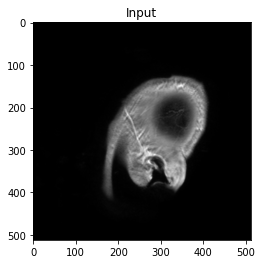

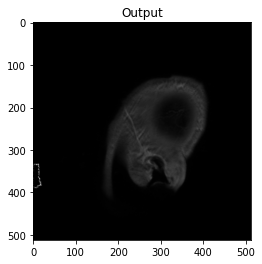

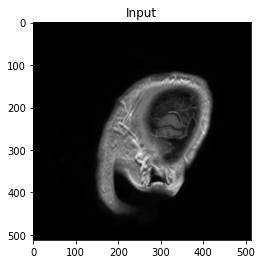

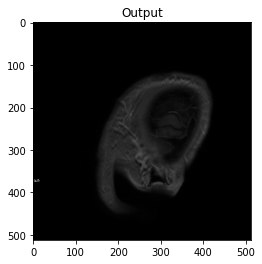

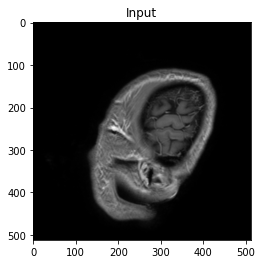

...

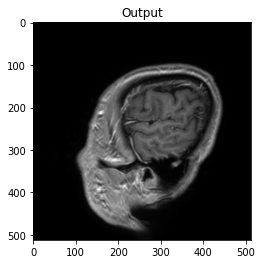

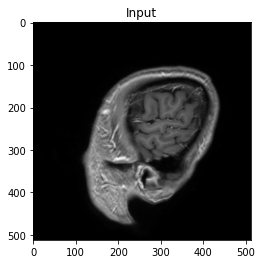

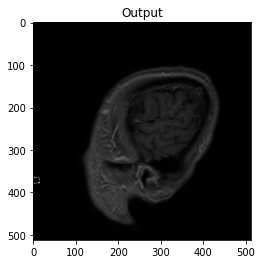

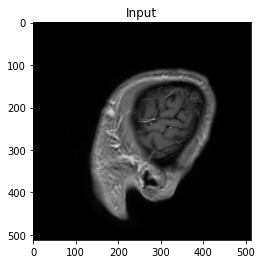

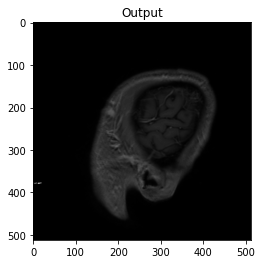

In [11]:
for i in range(len(iscan[0][5])):
    plt.imshow(iscan[0][5][i],'gray')
    plt.title("Input")
    plt.show()
    plt.imshow(oscan[0][5][i],'gray')
    plt.title("Output")
    plt.show()

100%|███████████████████████████████████████████| 26/26 [00:05<00:00,  4.53it/s]

series number:  0
15


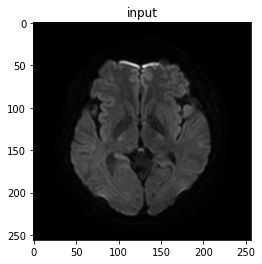

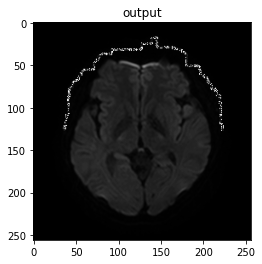

0.5760381149770484 0.44734771001089285
0.9791002363692889
series number:  1
15


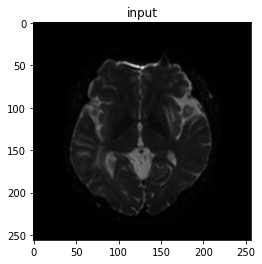

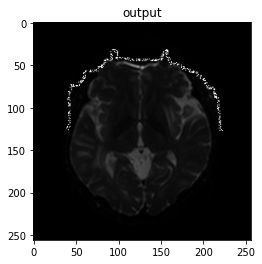

0.5049476725508318 0.35868872759247244
0.9774892558989893
series number:  2
15


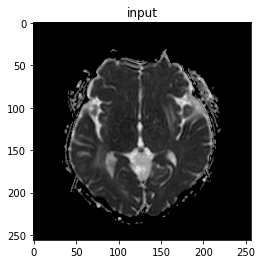

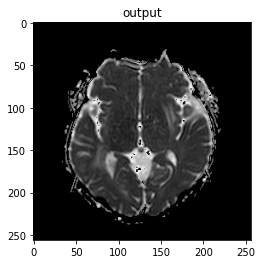

0.5295212245412206 0.5303837629762163
0.8569168661726783
series number:  3
15


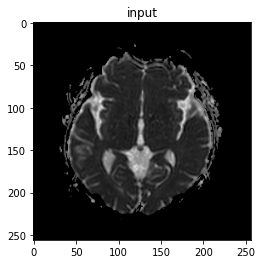

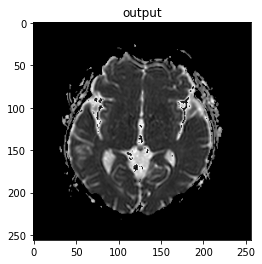

0.529464164224851 0.5313882650616795
0.8565213179939032
series number:  4
15


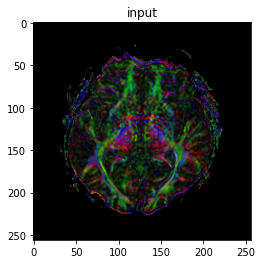

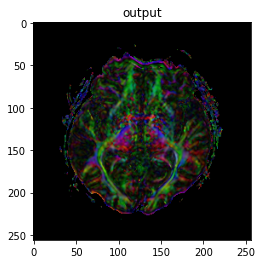

0.42378158578751735 0.42378158578751735
series number:  5
25


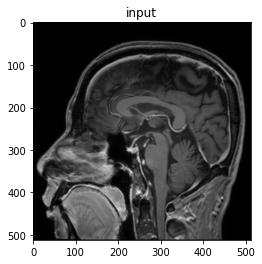

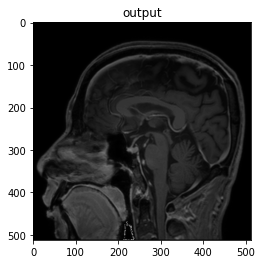

0.8957516140721726 0.8922555215901268
0.6253458825988968
series number:  6
25


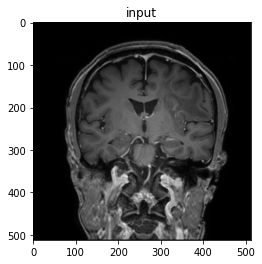

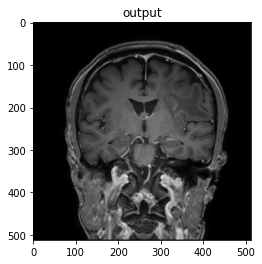

0.8211142912095309 0.8211142912095309
1.0
series number:  7
25


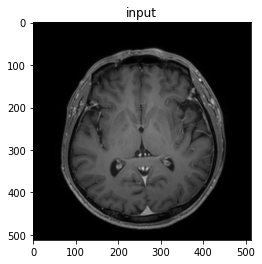

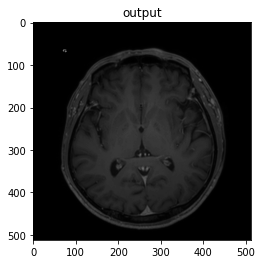

0.735294425918939 0.6954397715917476
0.648860965504234
series number:  8
25


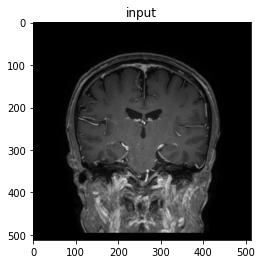

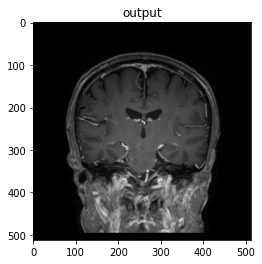

0.7423081687673062 0.7423081687673062
1.0
series number:  9
25


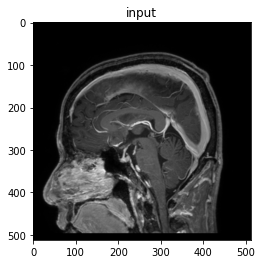

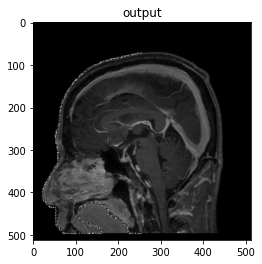

0.7866341927493533 0.7485790070747765
0.657601202702005
series number:  10
25


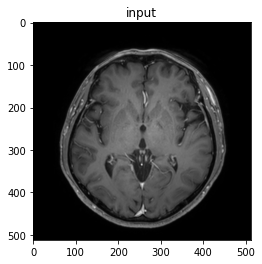

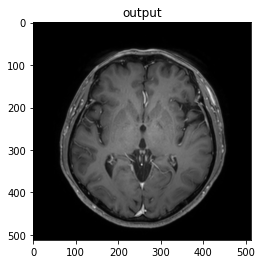

0.7299850202184468 0.6895336396919973
0.6516398407892126
series number:  11
15


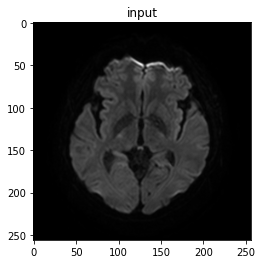

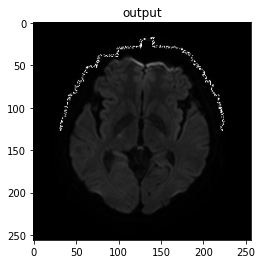

0.5783333373281848 0.43360160989605234
0.9795978184485828
series number:  12
12


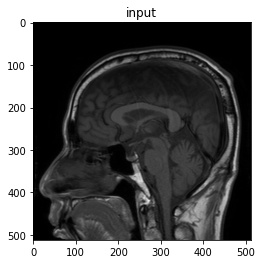

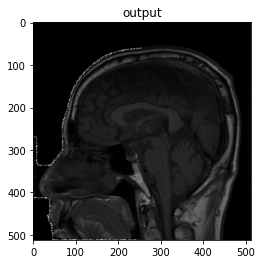

0.8651668063578027 0.8453218708798635
0.7912965633520285
series number:  13
15


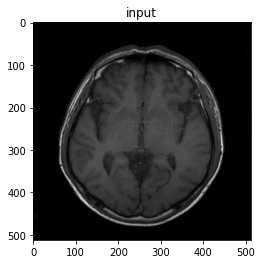

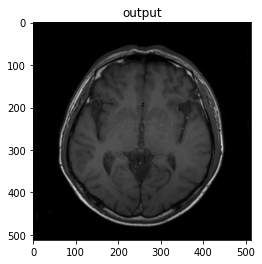

0.6842083605299857 0.6712909247129771
0.6213659411424723
series number:  14
120


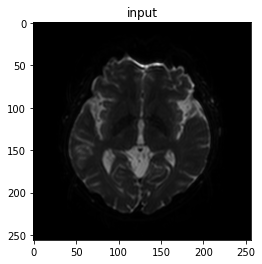

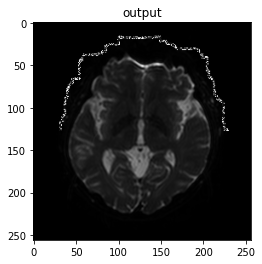

0.40679914940635276 0.28373353933046475
0.7615828623834102
series number:  15
15


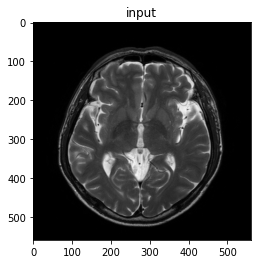

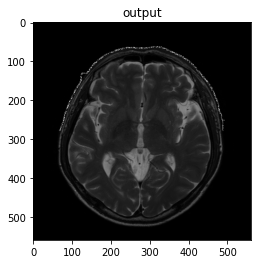

0.6789023513033046 0.653592722644141
0.5491962592755693
series number:  16
15


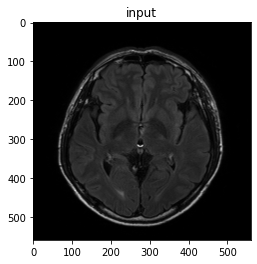

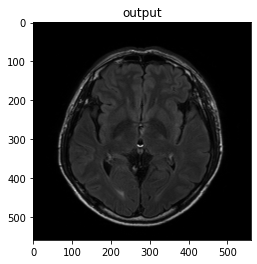

0.6463156665841325 0.6455423774233029
0.6217241432829392
series number:  17
190


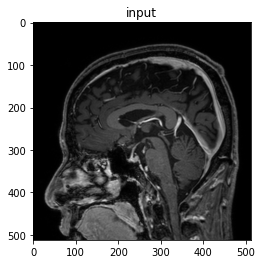

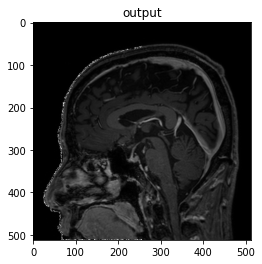

0.7054784248527409 0.6544593974013213
0.652472248617094
series number:  18
13


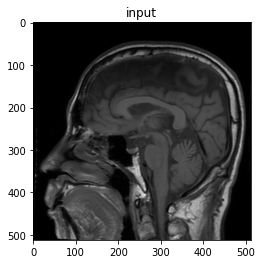

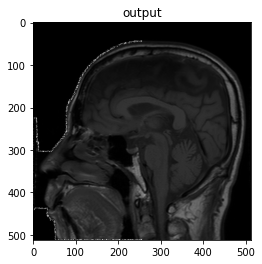

0.9124532124781711 0.8844764567556118
0.8403928216906871
series number:  19
15


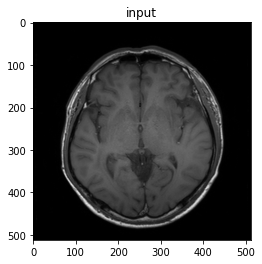

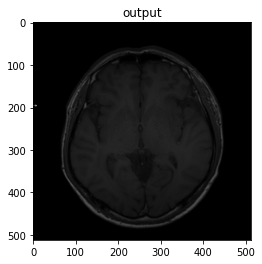

0.7038530263685941 0.6915750626292985
0.736112367313505
series number:  20
120


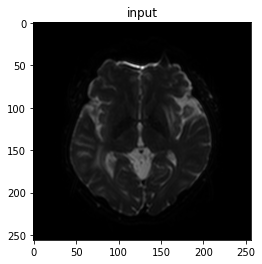

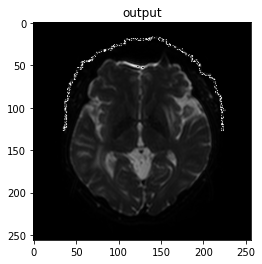

0.4101513735239848 0.2867372825825181
0.7643645334821793
series number:  21
15


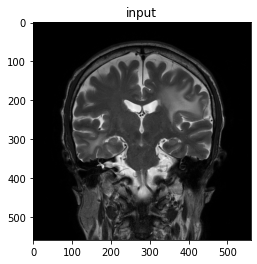

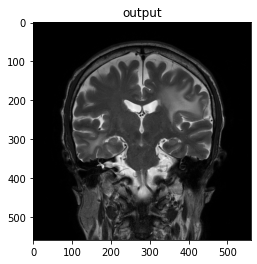

0.752676636297164 0.752676636297164
1.0
series number:  22
15


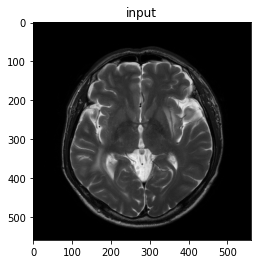

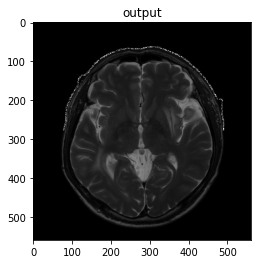

0.6726886714287238 0.6386408231002475
0.5636878475672643
series number:  23
15


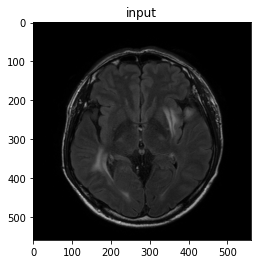

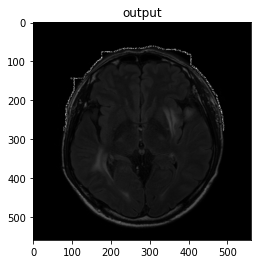

0.6507196310227521 0.5843233521071692
0.5317440666493971
series number:  24
190


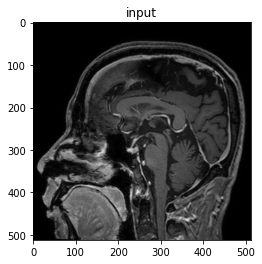

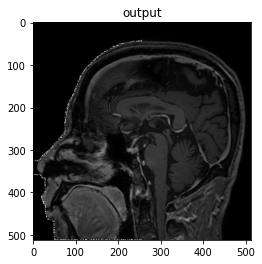

0.726077125151155 0.6785897498929404
0.6436652031967925
series number:  25
15


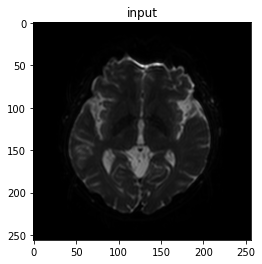

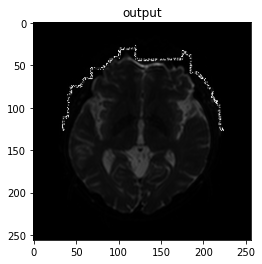

0.508449855499704 0.35656978906553016
0.9785410801359552


[(4,
  ValueError('win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.'))]

In [17]:
ipath = r"/home/abdullah/mri_fa/MRI_DATA_HB/brain/20392703/" #20392703
opath = r"/home/minha/FARZEEN/face ann/face mri/output_brain/20392703/"
scan_seriesi, filenamesi = main(ipath, opath)
get_imgs_score(scan_seriesi, filenamesi, opath)

100%|█████████████████████████████████████████████| 6/6 [00:01<00:00,  3.80it/s]


series number:  0
26


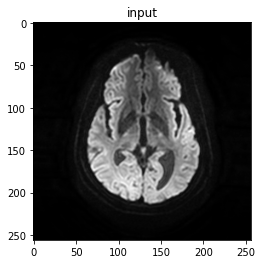

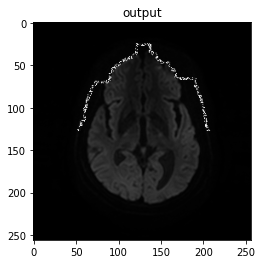

0.5022255760894684 0.381569112222654
0.9787075692613664
series number:  1
102


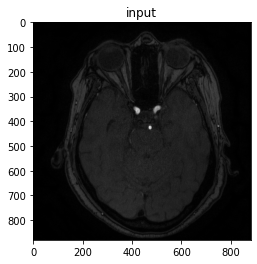

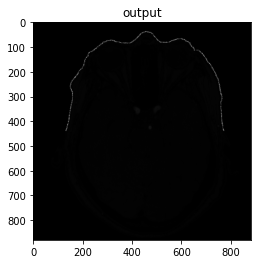

0.946013942984981 0.1711237355131999
0.9921859808927315
series number:  2
12


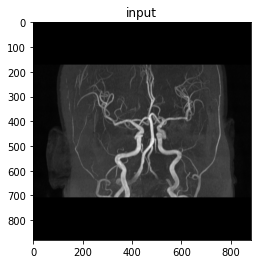

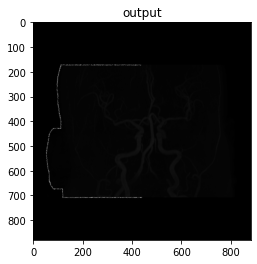

0.9012443237223506 0.3235901378957506
0.9925029260933853
series number:  3
12


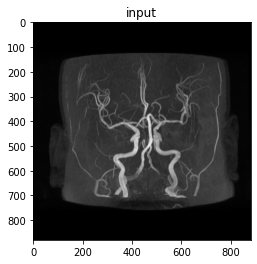

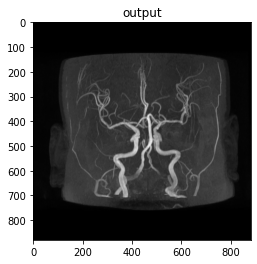

1.134838482749207 0.5471130924306072
0.9972795770985822
series number:  4
26


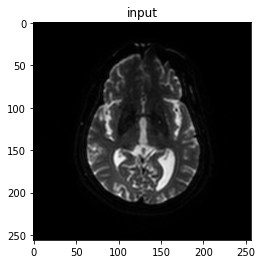

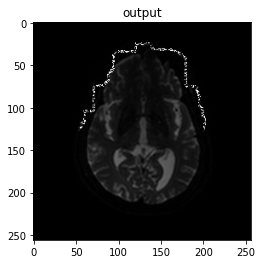

0.40662223325357394 0.30530560146245106
0.9786245144859618
series number:  5
26


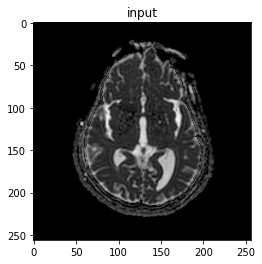

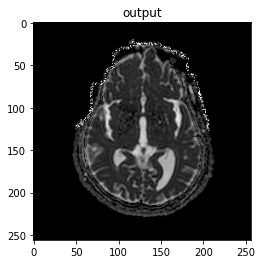

0.49473981457400273 0.4740227012304455
0.9826727654619245


[]

In [18]:
ipath = r"/home/abdullah/mri_fa/MRI_DATA_HB/brain/000250848/" #20392703
opath = r"/home/minha/FARZEEN/face ann/face mri/output_brain/000250848/"
scan_seriesi, filenamesi = main(ipath, opath)
get_imgs_score(scan_seriesi, filenamesi, opath)

100%|███████████████████████████████████████████| 12/12 [00:02<00:00,  4.14it/s]

series number:  0
15


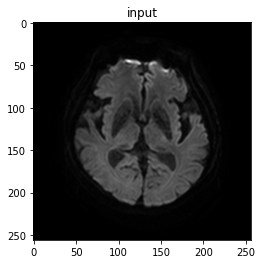

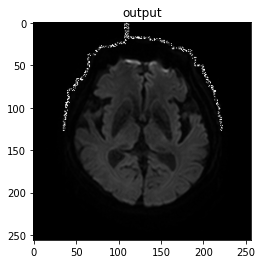

0.5363279148381619 0.4430537085435567
0.9767530153670555
series number:  1
15


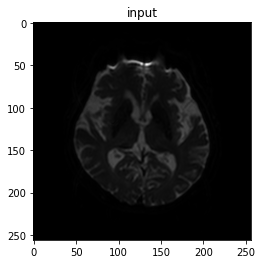

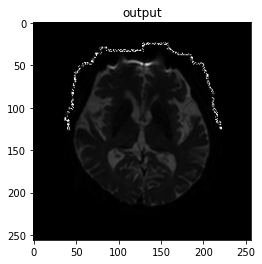

0.4687054352017077 0.3281665407180254
0.9786681685842303
series number:  2
25


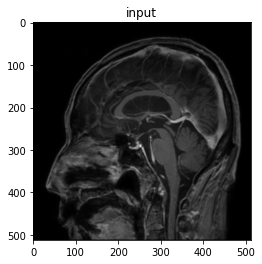

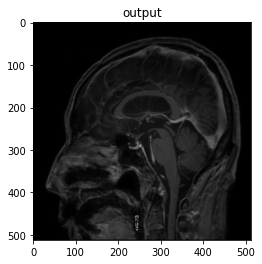

0.8404243473120768 0.836987080085908
0.6562706341636186
series number:  3
25


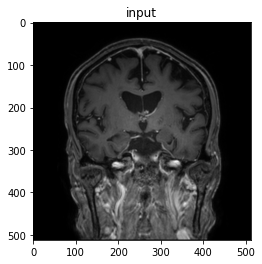

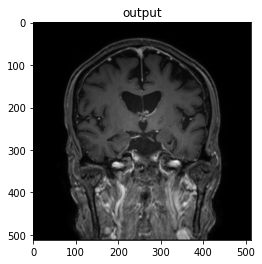

0.7925178266204256 0.7925178266204256
1.0
series number:  4
25


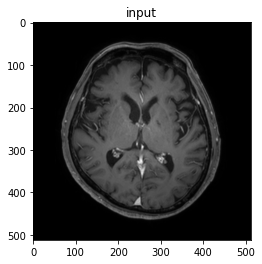

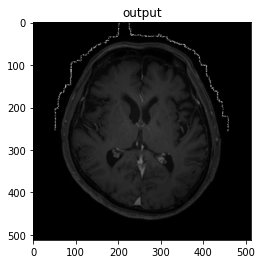

0.681011784407131 0.6178759800700722
0.6790214936506626
series number:  5
13


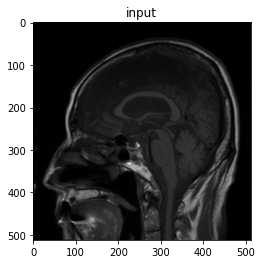

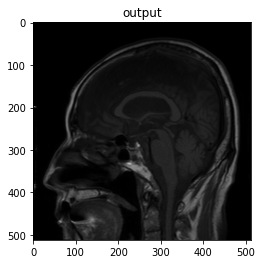

0.7944230561814469 0.7861274939037682
0.887708983312179
series number:  6
15


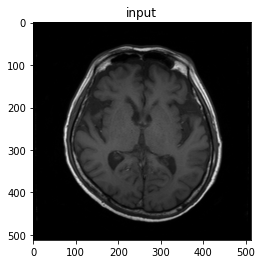

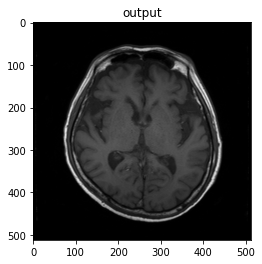

0.6158492191771968 0.607445581893915
0.7237086363286471
series number:  7
120


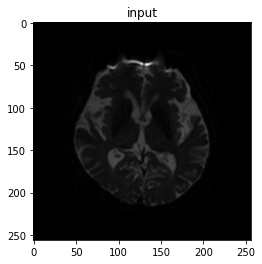

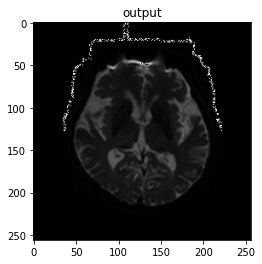

0.3555937294178531 0.27611006642273916
0.620825058840811
series number:  8
15


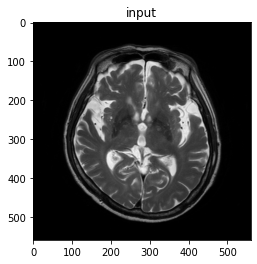

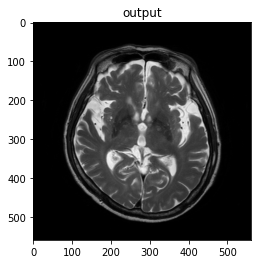

0.6508001282381085 0.6499298493177504
0.7668016676923797
series number:  9
15


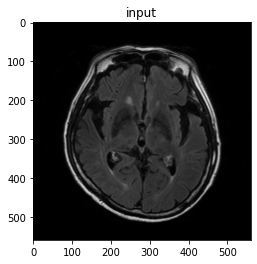

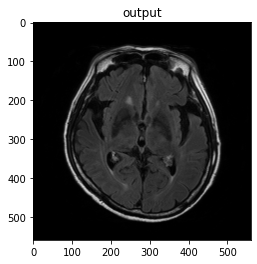

0.6032818701119896 0.6018651389843502
0.7550931719561464
series number:  10
185


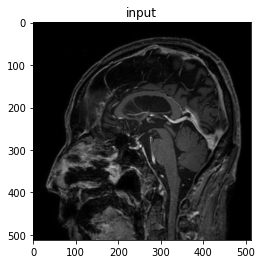

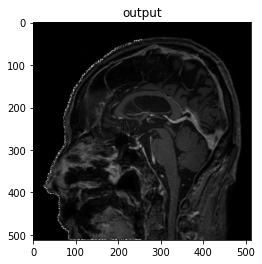

0.6970760148398456 0.6391200592512339
0.6556741673242873
series number:  11
15


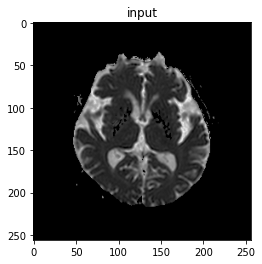

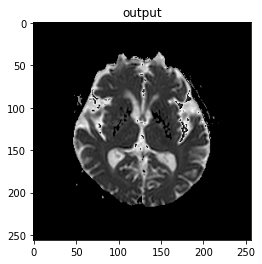

0.4424528150888859 0.4432644031820156
0.8810767576536928


[]

In [19]:
ipath = r"/home/abdullah/mri_fa/MRI_DATA_HB/brain/33145988/" #20392703
opath = r"/home/minha/FARZEEN/face ann/face mri/output_brain/33145988/"
scan_seriesi, filenamesi = main(ipath, opath)
get_imgs_score(scan_seriesi, filenamesi, opath)

100%|███████████████████████████████████████████| 12/12 [00:02<00:00,  4.40it/s]

series number:  0
15


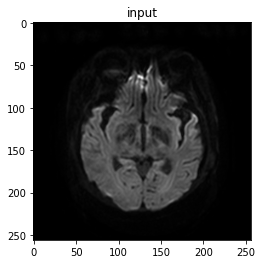

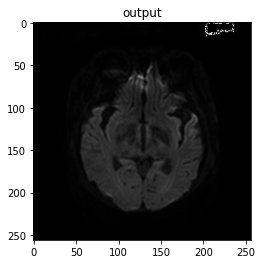

0.5430440084065792 0.43695889118166026
0.977159229100733
series number:  1
15


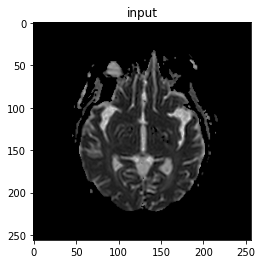

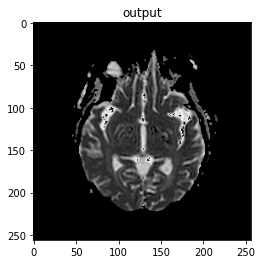

0.4112698807206753 0.4127012678919634
0.8862978872569549
series number:  2
15


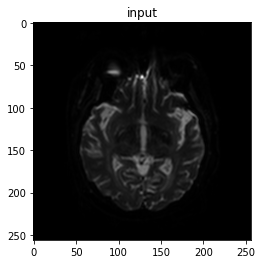

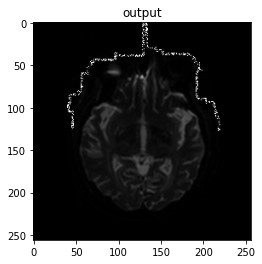

0.43446045157081264 0.3101939293818473
0.9759613780073779
series number:  3
25


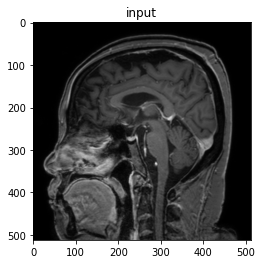

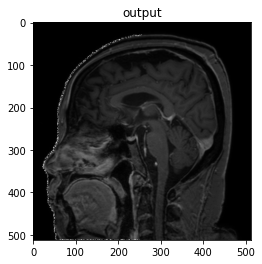

0.9529896149848512 0.8736964478674059
0.5510031820554293
series number:  4
25


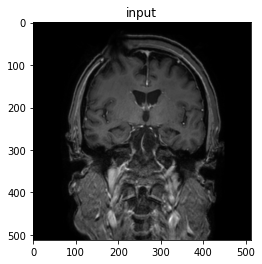

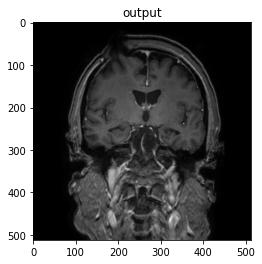

0.874235422920957 0.874235422920957
1.0
series number:  5
25


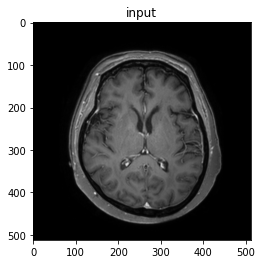

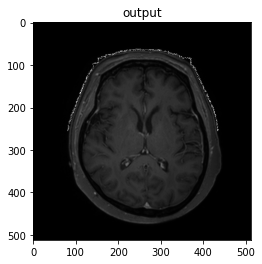

0.679259330587214 0.6240036667669112
0.6403098058786403
series number:  6
13


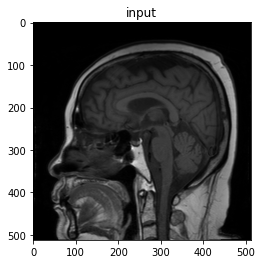

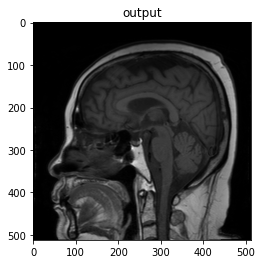

0.8667653370432947 0.8653993438568532
0.9516564000068016
series number:  7
15


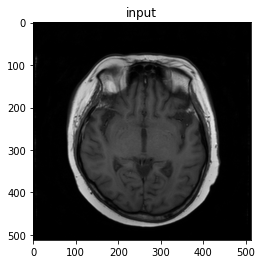

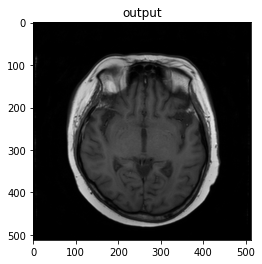

0.6242078537066942 0.6181196624918592
0.5720421710029581
series number:  8
120


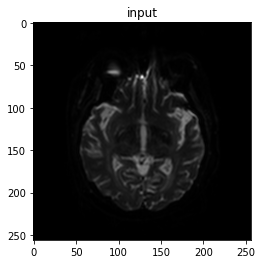

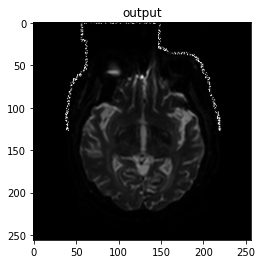

0.3741658663146902 0.26609144378111516
0.5905211437327585
series number:  9
15


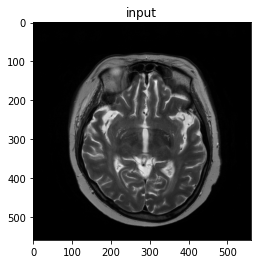

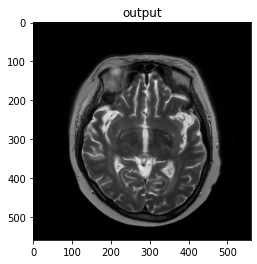

0.6827859296843959 0.6805631629185569
0.7449462842053327
series number:  10
15


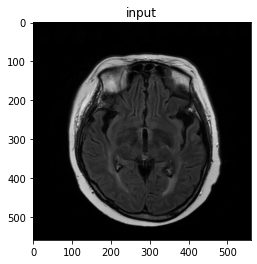

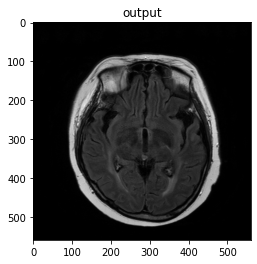

0.5996950246912927 0.596787938935434
0.5625644076272103
series number:  11
175


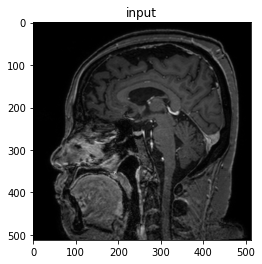

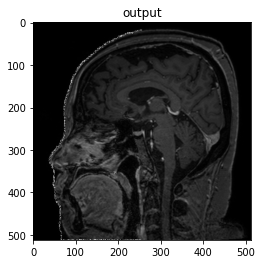

0.8375563760402249 0.7853630706215735
0.5689218321886238


[]

In [20]:
ipath = r"/home/abdullah/mri_fa/MRI_DATA_HB/brain/20007353/" #20392703
opath = r"/home/minha/FARZEEN/face ann/face mri/output_brain/20007353/"
scan_seriesi, filenamesi = main(ipath, opath)
get_imgs_score(scan_seriesi, filenamesi, opath)

100%|███████████████████████████████████████████| 22/22 [00:06<00:00,  3.48it/s]

series number:  0
10


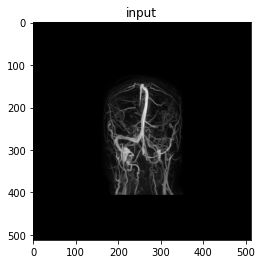

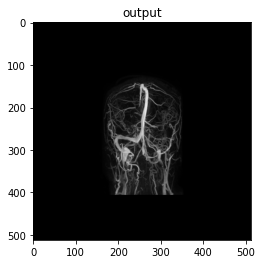

0.3498995097136729 0.3498995097136729
1.0
series number:  1
10


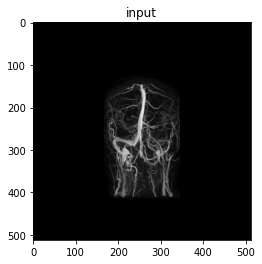

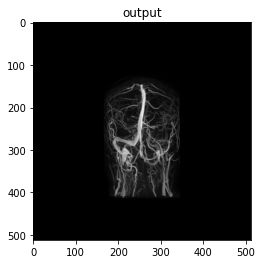

0.320284863513468 0.320284863513468
1.0
series number:  2
10


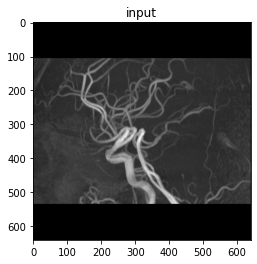

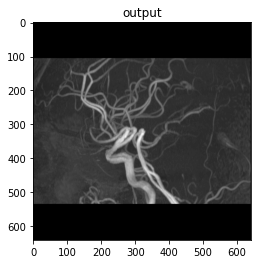

1.115482184472665 1.115482184472665
1.0
series number:  3
10


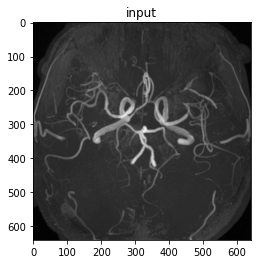

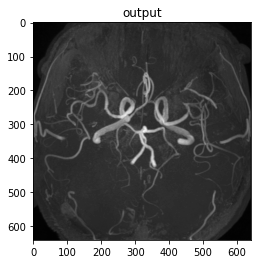

1.8524450066302767 1.8524450066302767
1.0
series number:  4
10


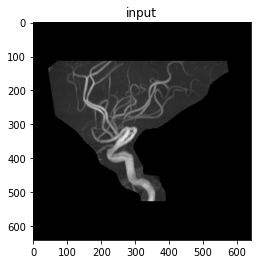

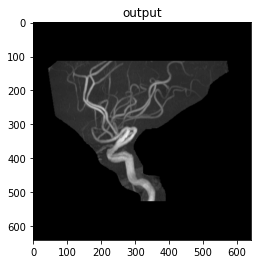

0.6873521563133166 0.6873521563133166
1.0
series number:  5
10


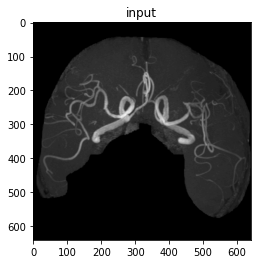

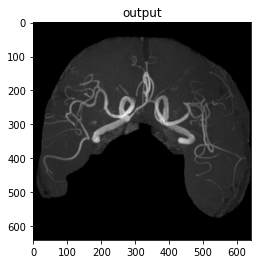

0.8477484475320454 0.8477484475320454
1.0
series number:  6
10


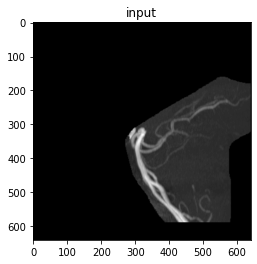

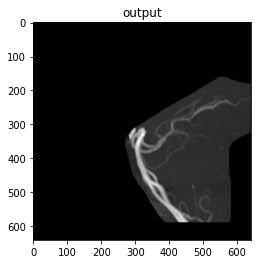

0.5854056376098665 0.5854056376098665
1.0
series number:  7
10


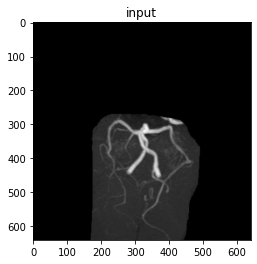

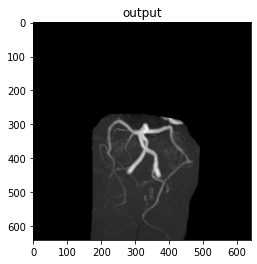

0.5373906716121746 0.5373906716121746
1.0
series number:  8
10


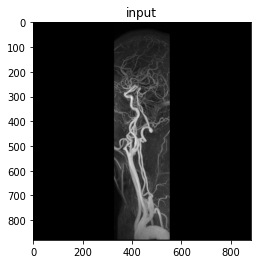

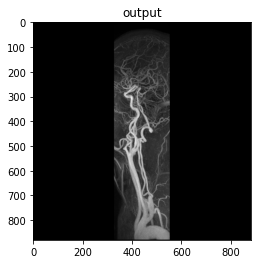

0.7407960647944054 0.7407960647944054
1.0
series number:  9
10


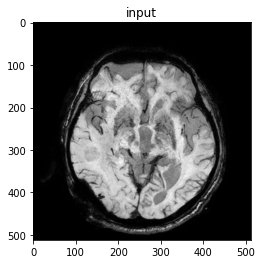

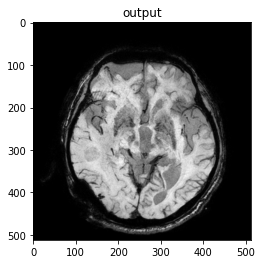

0.6150355032990606 0.24115119050351103
0.995306747623451
series number:  10
85


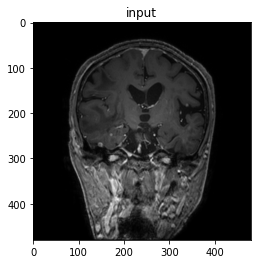

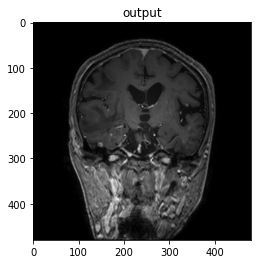

0.7122591959509574 0.7122591959509574
1.0
series number:  11
75


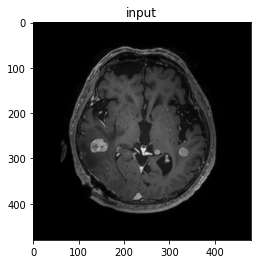

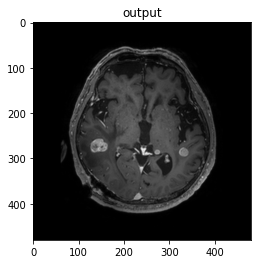

0.6189523642758717 0.4770417048244533
0.9938521323004486
series number:  12
250


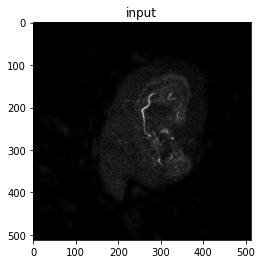

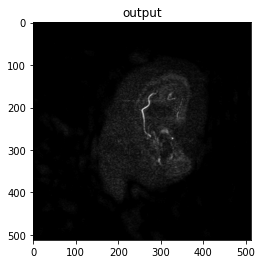

0.5125621031829235 0.4056571708493628
0.9963815365020886
series number:  13
80


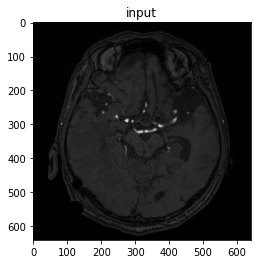

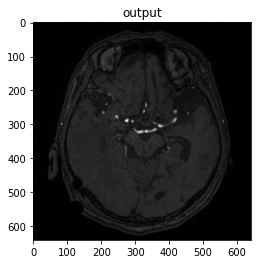

0.9722932552147299 0.9208058866230598
0.9999922508401756
series number:  14
10


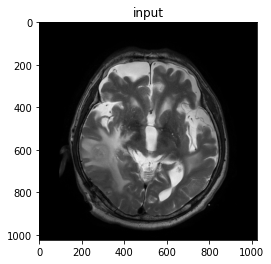

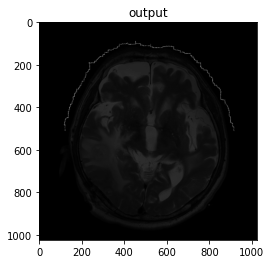

0.6986786102383272 0.6531482745293498
0.9984639570838093
series number:  15
10


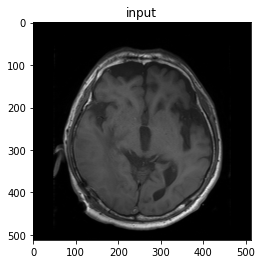

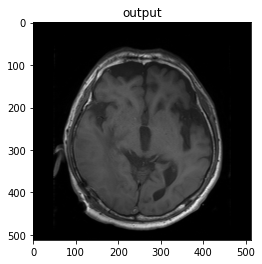

0.7000029540161324 0.6228481474123693
0.9968686957512543
series number:  16
10


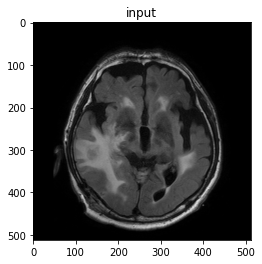

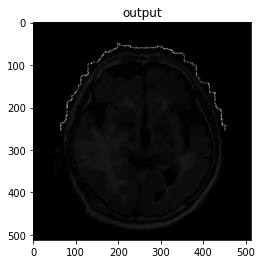

0.6844937305560266 0.4750874337254018
0.9916735295934841
series number:  17
12


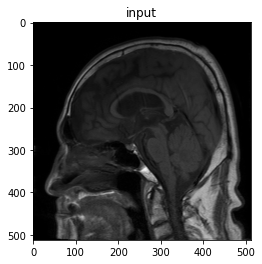

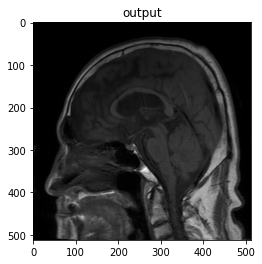

0.8649689079767917 0.8591724142228443
0.9997533524701216
series number:  18
10


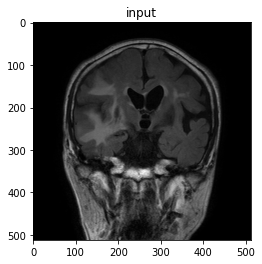

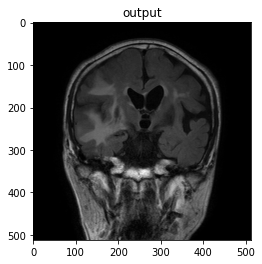

0.7592756186410318 0.7592756186410318
1.0
series number:  19
90


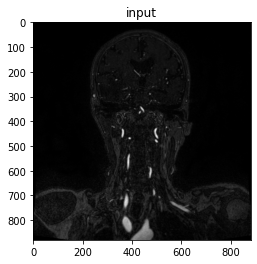

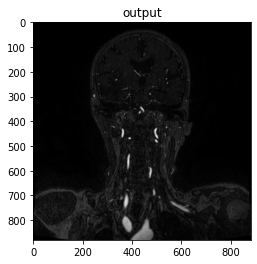

0.6469320903525406 0.6469320903525406
1.0
series number:  20
180


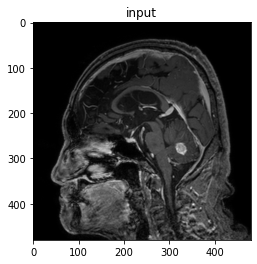

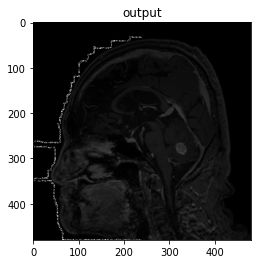

0.7015965510466289 0.6820600026586566
0.9994068307095508
series number:  21
10


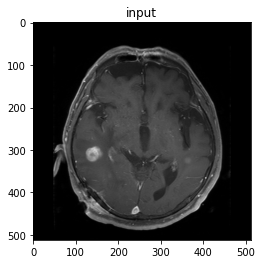

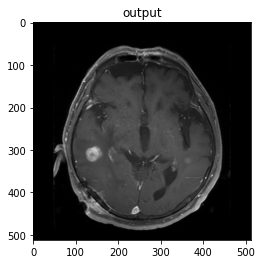

0.7462966435445145 0.6839102746665677
0.9968679792100805


[]

In [21]:
ipath = r"/home/abdullah/mri_fa/MRI_DATA_HB/brain/01172857/" #20392703
opath = r"/home/minha/FARZEEN/face ann/face mri/output_brain/01172857/"
scan_seriesi, filenamesi = main(ipath, opath)
get_imgs_score(scan_seriesi, filenamesi, opath)

100%|█████████████████████████████████████████████| 5/5 [00:01<00:00,  2.90it/s]

series number:  0
12


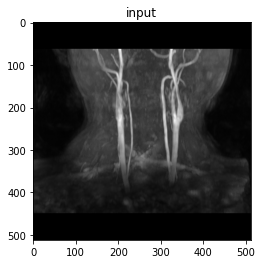

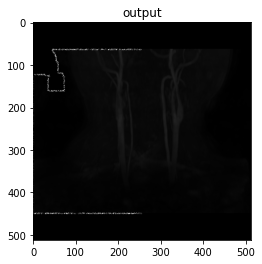

0.8681564812045641 0.48868438478490417
0.9943822250951923
series number:  1
102


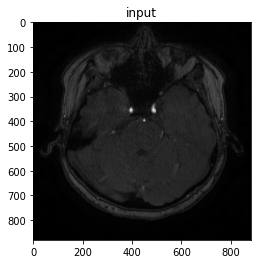

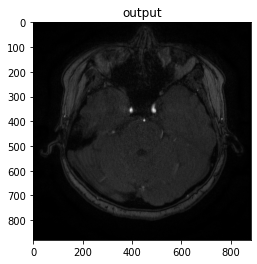

0.9448015502378333 0.9448015502378333
1.0
series number:  2
76


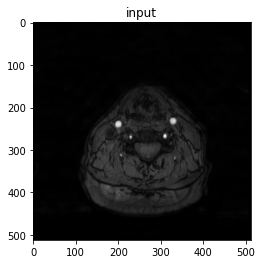

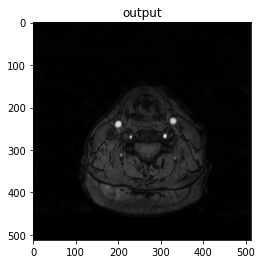

0.6707015470988961 0.5538899679523287
0.9998044171145987
series number:  3
12


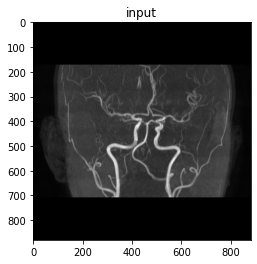

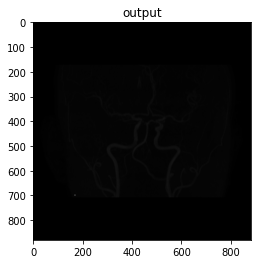

0.8994602497558954 0.8579022223946948
0.9999086218262964
series number:  4
12


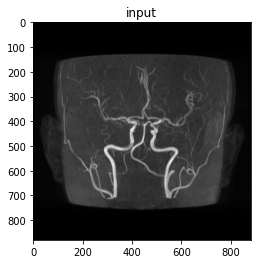

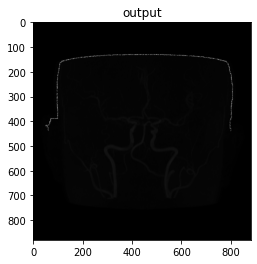

1.1598289092655054 0.4258286124467269
0.9964272770564998


[]

In [22]:
ipath = r"/home/abdullah/mri_fa/MRI_DATA_HB/brain/000314354/" #20392703
opath = r"/home/minha/FARZEEN/face ann/face mri/output_brain/000314354/"
scan_seriesi, filenamesi = main(ipath, opath)
get_imgs_score(scan_seriesi, filenamesi, opath)